In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/Govind155/Web-Phishing-Detection-/main/dataset.csv')

In [4]:
df.head()

,index,having_IPhaving_IP_Address,URLURL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,...,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
0,1,-1,1,1,NaN,-1,-1,-1,-1,-1,...,1,1,-1,-1,-1,-1,1,1,-1,-1
1,2,1,1,1,1.0,1,-1,0,1,-1,...,1,1,-1,-1,0,-1,1,1,1,-1
2,3,1,0,1,1.0,1,-1,-1,-1,-1,...,1,1,1,-1,1,-1,1,0,-1,-1
3,4,1,0,1,1.0,1,-1,-1,-1,1,...,1,1,-1,-1,1,-1,1,-1,1,-1
4,5,1,0,-1,NaN,1,-1,1,1,-1,...,-1,1,-1,-1,0,-1,1,1,1,1


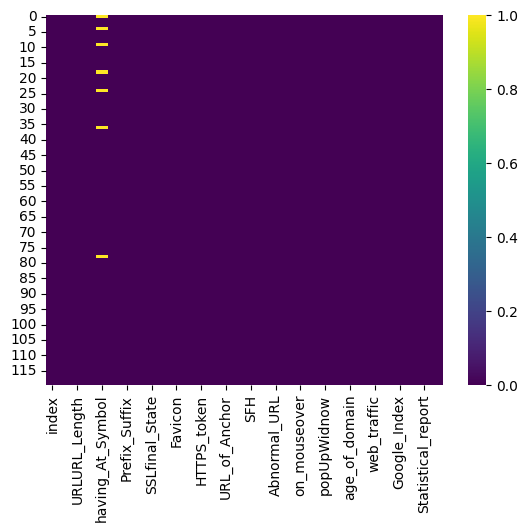

In [5]:
sns.heatmap(df[0:120].isnull(), cmap= 'viridis')
plt.savefig('heatmap.png')

In [6]:
df.describe()

,index,having_IPhaving_IP_Address,URLURL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,...,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
count,11055.000000,11055.000000,11055.000000,11055.000000,10959.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,...,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000
mean,5528.000000,0.313795,-0.633198,0.738761,0.703440,0.741474,-0.734962,0.063953,0.250927,-0.336771,...,0.613388,0.816915,0.061239,0.377114,0.287291,-0.483673,0.721574,0.344007,0.719584,0.113885
std,3191.447947,0.949534,0.766095,0.673998,0.710787,0.671011,0.678139,0.817518,0.911892,0.941629,...,0.789818,0.576784,0.998168,0.926209,0.827733,0.875289,0.692369,0.569944,0.694437,0.993539
min,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,2764.500000,-1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,1.000000,1.000000,-1.000000,-1.000000,0.000000,-1.000000,1.000000,0.000000,1.000000,-1.000000
50%,5528.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,0.000000,1.000000,-1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,0.000000,1.000000,1.000000
75%,8291.500000,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,11055.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
print(df.corr()['Result'].sort_values())

Domain_registeration_length   -0.225789
Shortining_Service            -0.067966
Abnormal_URL                  -0.060488
HTTPS_token                   -0.039854
double_slash_redirecting      -0.038608
Redirect                      -0.020113
Iframe                        -0.003394
Favicon                       -0.000280
popUpWidnow                    0.000086
index                          0.000978
RightClick                     0.012653
Submitting_to_email            0.018249
Links_pointing_to_page         0.032574
port                           0.036419
on_mouseover                   0.041838
having_At_Symbol               0.051330
URLURL_Length                  0.057430
DNSRecord                      0.075718
Statistical_report             0.079857
having_IPhaving_IP_Address     0.094160
Page_Rank                      0.104645
age_of_domain                  0.121496
Google_Index                   0.128950
SFH                            0.221419
Links_in_tags                  0.248229


In [8]:
# Remove features having correlation coeff. between +/- 0.03
df.drop(['Favicon','Iframe','Redirect',
                'popUpWidnow','RightClick','Submitting_to_email'],axis=1,inplace=True)
print(len(df.columns))

26


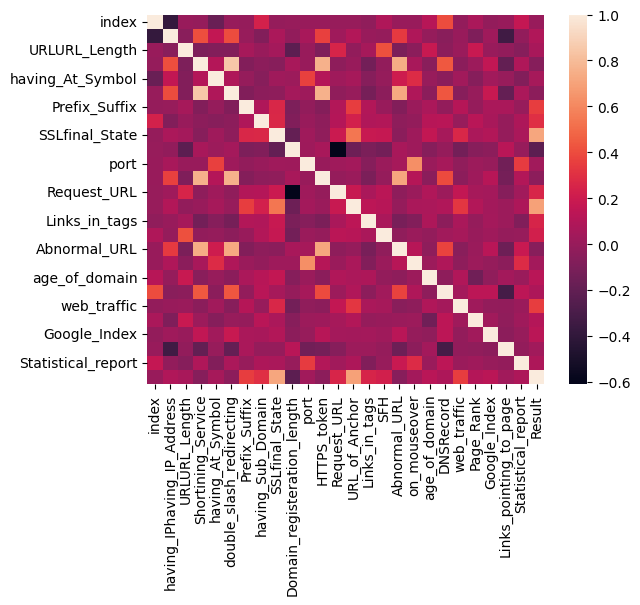

In [9]:
sns.heatmap(df.corr())
plt.savefig('corr.png')

In [10]:
l = [1,-1]
length = len(df)
# df.head()
for i in range(length):
  if(df['having_At_Symbol'].isnull().sum()):
    rand = random.randint(0,1)
    df['having_At_Symbol'][i] = l[rand]

df.head()

C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\1347988182.py:7: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['having_At_Symbol'][i] = l[rand]
C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\1347988182.py:7: SettingWithCopyWarn

,index,having_IPhaving_IP_Address,URLURL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,...,Abnormal_URL,on_mouseover,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
0,1,-1,1,1,-1.0,-1,-1,-1,-1,-1,...,-1,1,-1,-1,-1,-1,1,1,-1,-1
1,2,1,1,1,-1.0,1,-1,0,1,-1,...,1,1,-1,-1,0,-1,1,1,1,-1
2,3,1,0,1,-1.0,1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,0,-1,-1
3,4,1,0,1,-1.0,1,-1,-1,-1,1,...,1,1,-1,-1,1,-1,1,-1,1,-1
4,5,1,0,-1,-1.0,1,-1,1,1,-1,...,1,-1,-1,-1,0,-1,1,1,1,1


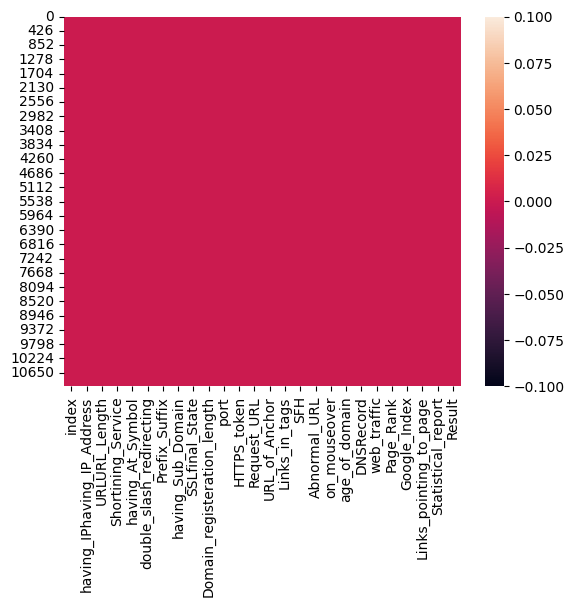

In [11]:
# print(df['having_At_Symbol'])
sns.heatmap(df.isnull())
plt.savefig('clean_heatmap.png')

<Axes: xlabel='having_At_Symbol', ylabel='count'>

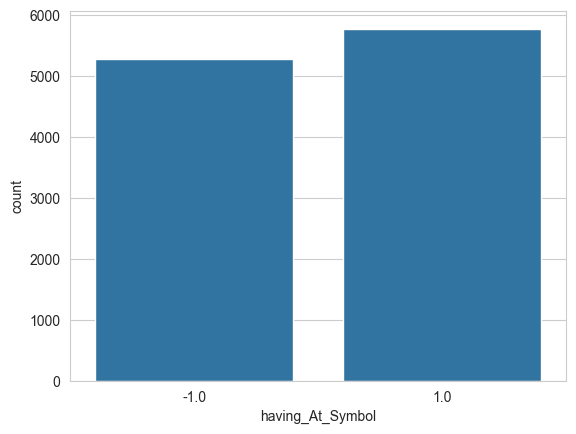

In [12]:
sns.set_style('whitegrid')
sns.countplot(x='having_At_Symbol',data=df)

<Axes: xlabel='having_IPhaving_IP_Address', ylabel='count'>

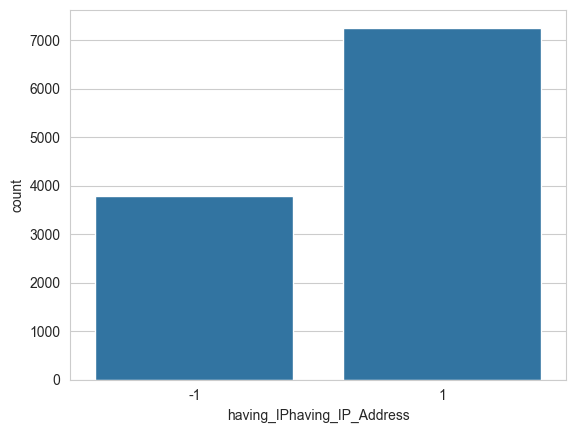

In [13]:
sns.countplot(x='having_IPhaving_IP_Address',data=df)

<Axes: xlabel='web_traffic', ylabel='count'>

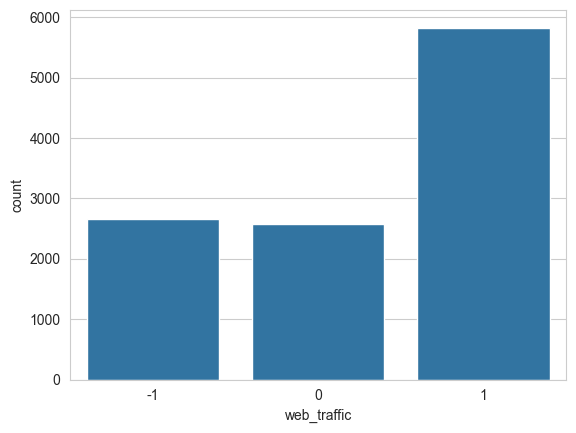

In [14]:
sns.countplot(x='web_traffic', data=df)

<Axes: xlabel='Result', ylabel='count'>

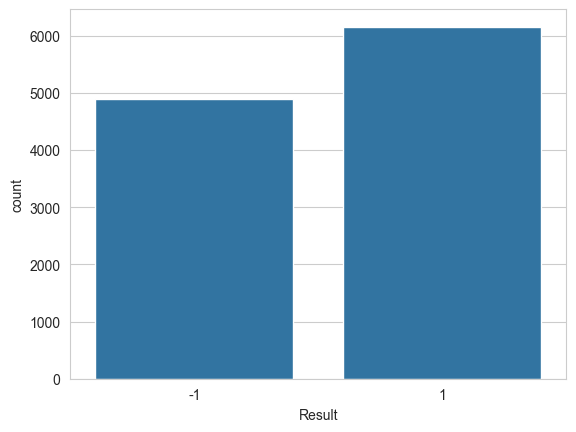

In [15]:
sns.countplot(x='Result', data=df)

<Axes: xlabel='Links_pointing_to_page', ylabel='count'>

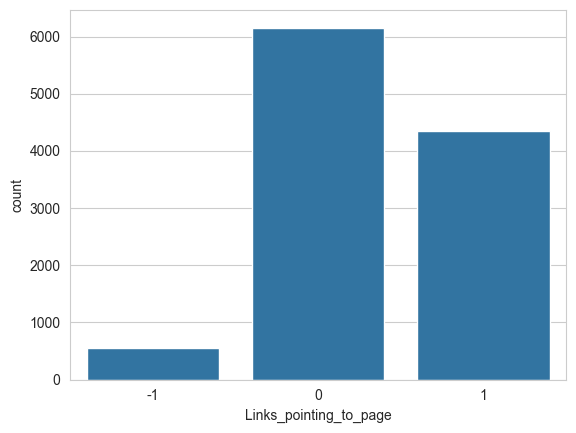

In [16]:
sns.countplot(x='Links_pointing_to_page', data=df)

<Axes: xlabel='Result', ylabel='count'>

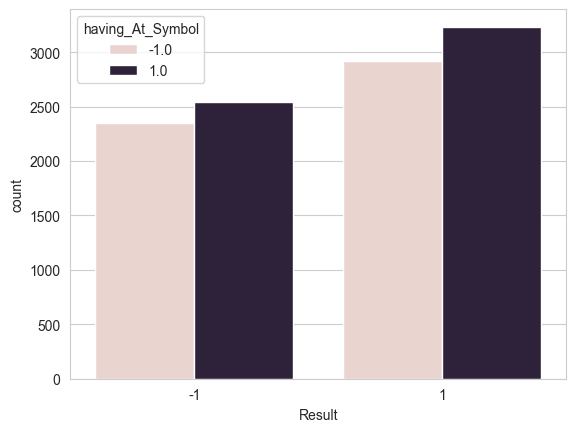

In [17]:
sns.countplot(x='Result', hue='having_At_Symbol', data=df)

C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2028433672.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Result'], color='darkred')


<Axes: xlabel='Result', ylabel='Density'>

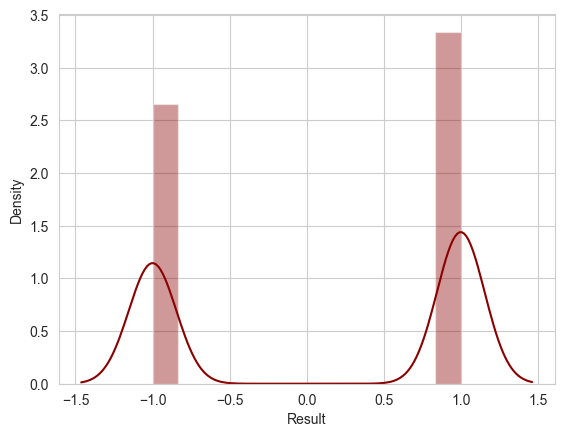

In [18]:
sns.distplot(df['Result'], color='darkred')

C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2941946132.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Links_pointing_to_page'])


<Axes: xlabel='Links_pointing_to_page', ylabel='Density'>

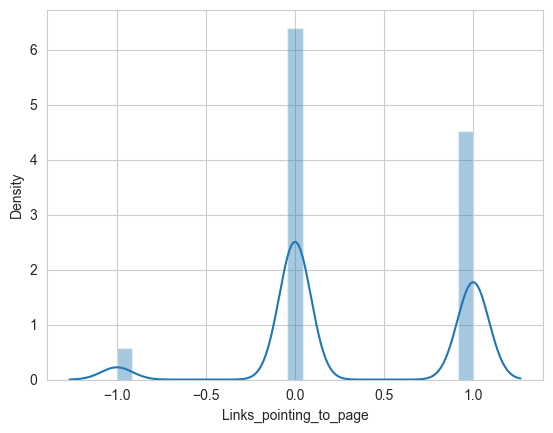

In [19]:
sns.distplot(df['Links_pointing_to_page'])

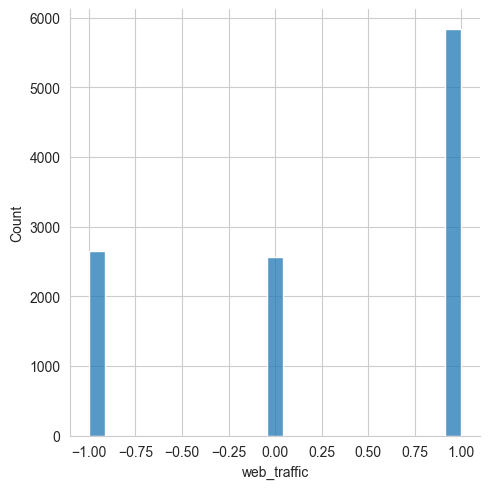

In [20]:
sns.displot(df['web_traffic'])

In [21]:
a=len(df[df.Result==0])
b=len(df[df.Result==-1])
c=len(df[df.Result==1])

In [22]:
print("Count of Legitimate Websites = ", b)
print("Count of Suspicious Websites = ", a)
print("Count of Phishy Websites = ", c)

Count of Legitimate Websites =  4898
Count of Suspicious Websites =  0
Count of Phishy Websites =  6157


In [23]:
df.drop(['index'],axis=1,inplace=True)
print(len(df.columns))

25


array([[<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>],
       [<Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>, <Axes: ylabel='Frequency'>,
        <Axes: ylabel='Frequency'>]], dtype=object)

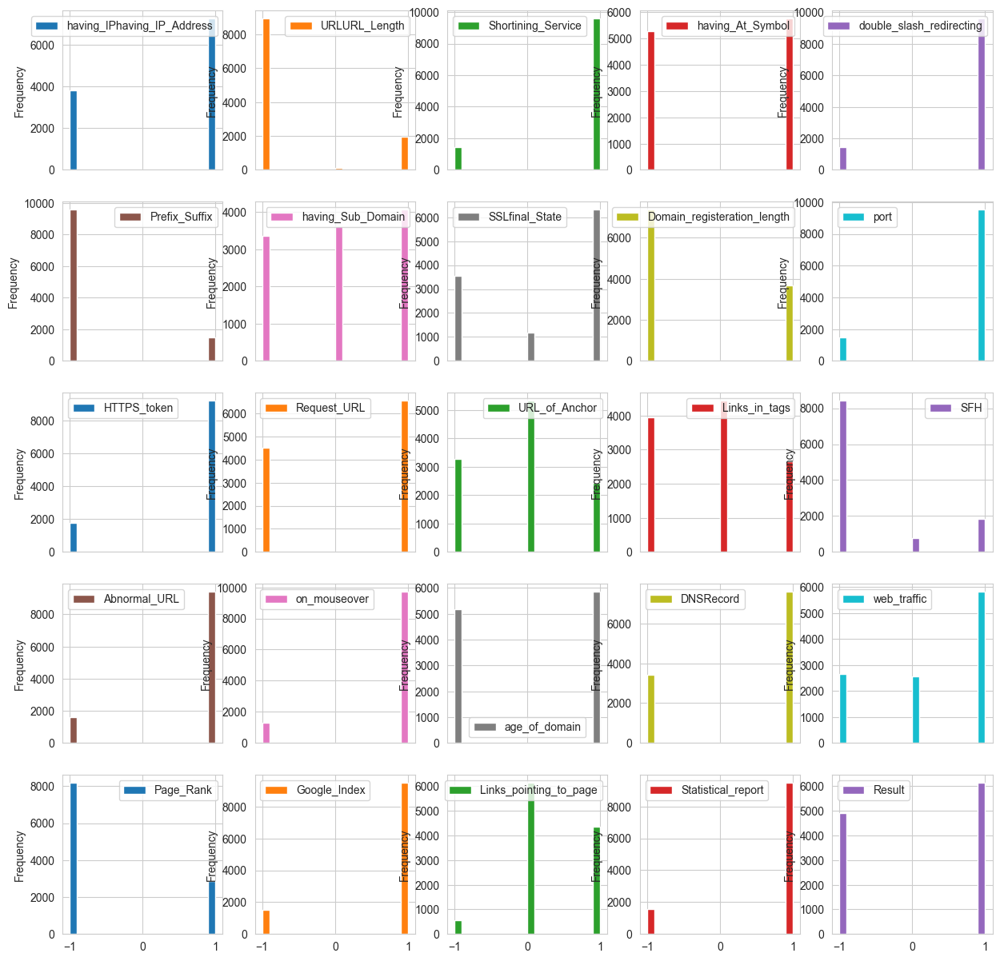

In [24]:

df.plot.hist(subplots=True,layout=(5,5),figsize=(15, 15), bins=20)


In [25]:
df.corr()

,having_IPhaving_IP_Address,URLURL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,port,...,Abnormal_URL,on_mouseover,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
having_IPhaving_IP_Address,1.000000,-0.052411,0.403461,-0.014707,0.397389,-0.005257,-0.080745,0.071414,-0.022739,0.060979,...,0.336549,0.084059,-0.010446,-0.050733,0.002922,-0.091774,0.029153,-0.339065,-0.019103,0.094160
URLURL_Length,-0.052411,1.000000,-0.097881,-0.006237,-0.081247,0.055247,0.003997,0.048754,-0.221892,0.000323,...,-0.106761,-0.045103,0.179426,-0.040823,0.008993,0.183518,0.002902,-0.022987,-0.067153,0.057430
Shortining_Service,0.403461,-0.097881,1.000000,0.011135,0.842796,-0.080471,-0.041916,-0.061426,0.060923,0.002201,...,0.739290,0.062383,-0.052596,0.436064,-0.047074,0.014591,0.155844,-0.198410,0.085461,-0.067966
having_At_Symbol,-0.014707,-0.006237,0.011135,1.000000,0.005333,-0.001440,0.019601,0.014725,0.009975,0.026445,...,0.025246,0.024221,0.021439,0.022493,-0.001305,-0.011037,0.008042,0.008366,0.011017,0.005828
double_slash_redirecting,0.397389,-0.081247,0.842796,0.005333,1.000000,-0.085590,-0.043079,-0.036200,0.047464,0.025060,...,0.723724,0.086635,-0.050107,0.431409,-0.062369,-0.003132,0.178415,-0.194165,0.070390,-0.038608
Prefix_Suffix,-0.005257,0.055247,-0.080471,-0.001440,-0.085590,1.000000,0.087891,0.261391,-0.096799,-0.022546,...,-0.077620,0.012578,0.074116,-0.016556,0.110598,-0.006834,0.067781,0.067423,-0.002763,0.348606
having_Sub_Domain,-0.080745,0.003997,-0.041916,0.019601,-0.043079,0.087891,1.000000,0.267649,-0.082839,0.004863,...,-0.034908,-0.018082,0.119254,0.125493,-0.005764,0.120730,0.057673,-0.010526,0.081627,0.298323
SSLfinal_State,0.071414,0.048754,-0.061426,0.014725,-0.036200,0.261391,0.267649,1.000000,-0.193622,0.027473,...,-0.046245,0.023586,0.162809,0.050972,0.258768,0.074545,0.096051,-0.011710,0.063411,0.714741
Domain_registeration_length,-0.022739,-0.221892,0.060923,0.009975,0.047464,-0.096799,-0.082839,-0.193622,1.000000,0.022478,...,0.058109,0.023784,-0.062851,-0.010477,-0.134454,-0.059898,-0.039766,0.122672,-0.002212,-0.225789
port,0.060979,0.000323,0.002201,0.026445,0.025060,-0.022546,0.004863,0.027473,0.022478,1.000000,...,0.054126,0.623298,0.008459,0.054849,-0.028543,0.017954,-0.005413,-0.139104,0.343987,0.036419


## Split the dataset

In [26]:
from sklearn.model_selection import train_test_split,cross_val_score

In [27]:
X= df.drop(columns='Result')
X.head()

,having_IPhaving_IP_Address,URLURL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,port,...,SFH,Abnormal_URL,on_mouseover,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report
0,-1,1,1,-1.0,-1,-1,-1,-1,-1,1,...,-1,-1,1,-1,-1,-1,-1,1,1,-1
1,1,1,1,-1.0,1,-1,0,1,-1,1,...,-1,1,1,-1,-1,0,-1,1,1,1
2,1,0,1,-1.0,1,-1,-1,-1,-1,1,...,-1,-1,1,1,-1,1,-1,1,0,-1
3,1,0,1,-1.0,1,-1,-1,-1,1,1,...,-1,1,1,-1,-1,1,-1,1,-1,1
4,1,0,-1,-1.0,1,-1,1,1,-1,1,...,-1,1,-1,-1,-1,0,-1,1,1,1


In [28]:
Y=df['Result']
Y=pd.DataFrame(Y)
Y.head()

,Result
0,-1
1,-1
2,-1
3,-1
4,1


In [29]:
train_X,test_X,train_Y,test_Y=train_test_split(X,Y,test_size=0.40,random_state=10)

In [30]:
print("Training set has {} samples.".format(train_X.shape[0]))
print("Testing set has {} samples.".format(test_X.shape[0]))

Training set has 6633 samples.
Testing set has 4422 samples.


## Lets apply Logistic Regression and check its accuracy

In [31]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report # type: ignore


#### Model Training

In [32]:
logreg=LogisticRegression()
model_1=logreg.fit(train_X,train_Y)

c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\utils\validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


####Model Testing

In [33]:
logreg_predict= model_1.predict(test_X)


In [34]:
print('The accurcy of Logistic Regression Model is : ', 100.0 * accuracy_score(logreg_predict,test_Y))

The accurcy of Logistic Regression Model is :  92.71822704658526


In [35]:
print(classification_report(logreg_predict,test_Y))


              precision    recall  f1-score   support

          -1       0.90      0.93      0.91      1864
           1       0.95      0.93      0.94      2558

    accuracy                           0.93      4422
   macro avg       0.92      0.93      0.93      4422
weighted avg       0.93      0.93      0.93      4422



In [36]:
def plot_confusion_matrix(test_Y, predict_y):
 C = confusion_matrix(test_Y, predict_y)
 A =(((C.T)/(C.sum(axis=1))).T)
 B =(C/C.sum(axis=0))
 plt.figure(figsize=(20,4))
 labels = [1,2]
 cmap=sns.light_palette("blue")
 plt.subplot(1, 3, 1)
 sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
 plt.xlabel('Predicted Class')
 plt.ylabel('Original Class')
 plt.title("Confusion matrix")
 plt.subplot(1, 3, 2)
 sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
 plt.xlabel('Predicted Class')
 plt.ylabel('Original Class')
 plt.title("Precision matrix")
 plt.subplot(1, 3, 3)
 sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
 plt.xlabel('Predicted Class')
 plt.ylabel('Original Class')
 plt.title("Recall matrix")
 plt.show()

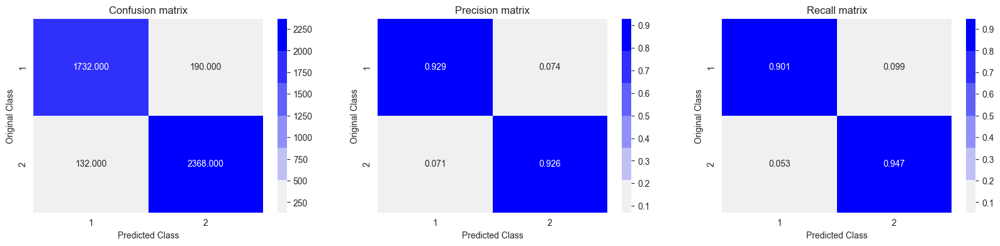

In [37]:
plot_confusion_matrix(test_Y, logreg_predict)


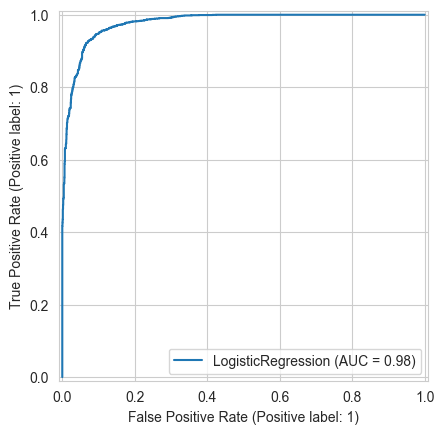

In [38]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay

RocCurveDisplay.from_estimator(model_1,test_X, test_Y)

## Lets apply K-Nearest Neighbors Classifier and check its accuracy



In [39]:
from sklearn.neighbors import KNeighborsClassifier


In [40]:
error = []
for i in range(1, 30):
  knn = KNeighborsClassifier(n_neighbors=i)
  knn.fit(train_X, train_Y.values.ravel())
  pred_i = knn.predict(test_X)
  error.append(np.mean(pred_i != test_Y.values.ravel()))

Text(0, 0.5, 'Error Rate')

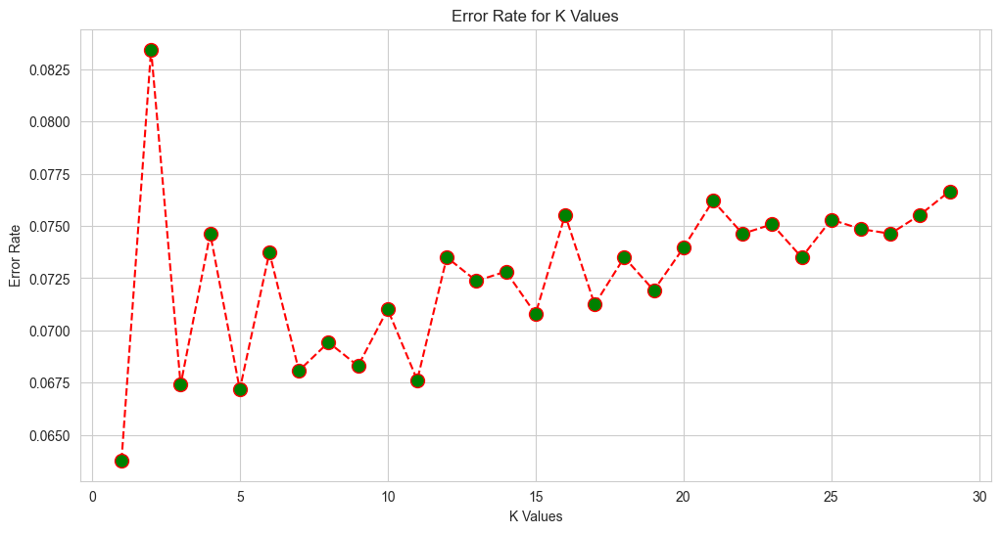

In [41]:
plt.figure(figsize=(12,6))
plt.plot(range(1,30), error, color='red', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)
plt.title('Error Rate for K Values')
plt.xlabel('K Values')
plt.ylabel('Error Rate')

#### Model Training

##### KNN Classifier for K = 1

In [42]:
knn=KNeighborsClassifier(n_neighbors=1)
model_2= knn.fit(train_X,train_Y)

c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


In [43]:
knn_predict=model_2.predict(test_X)

In [44]:
print('The accuracy of KNN Model is: ', 100.0 * accuracy_score(knn_predict,test_Y))

The accuracy of KNN Model is:  93.62279511533242


In [45]:
print(classification_report(test_Y,knn_predict))

              precision    recall  f1-score   support

          -1       0.92      0.94      0.93      1922
           1       0.95      0.94      0.94      2500

    accuracy                           0.94      4422
   macro avg       0.93      0.94      0.94      4422
weighted avg       0.94      0.94      0.94      4422



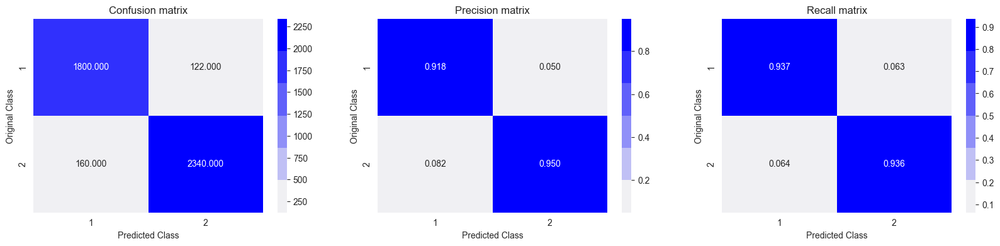

In [46]:
plot_confusion_matrix(test_Y, knn_predict)

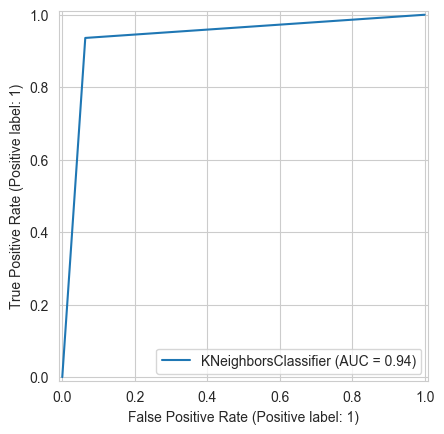

In [47]:
RocCurveDisplay.from_estimator(model_2,test_X, test_Y)

## Lets apply Decision Tree Classifier and check its classifier



In [48]:
from sklearn.tree import DecisionTreeClassifier

In [49]:
dtree=DecisionTreeClassifier()
model_3=dtree.fit(train_X,train_Y)

In [50]:
dtree_predict=model_3.predict(test_X)

In [51]:
print('The accuracy of Decision Tree Classifier is: ', 100.0 * accuracy_score(dtree_predict,test_Y))

The accuracy of Decision Tree Classifier is:  95.34147444595206


In [52]:
print(classification_report(dtree_predict,test_Y))

              precision    recall  f1-score   support

          -1       0.95      0.94      0.95      1940
           1       0.96      0.96      0.96      2482

    accuracy                           0.95      4422
   macro avg       0.95      0.95      0.95      4422
weighted avg       0.95      0.95      0.95      4422



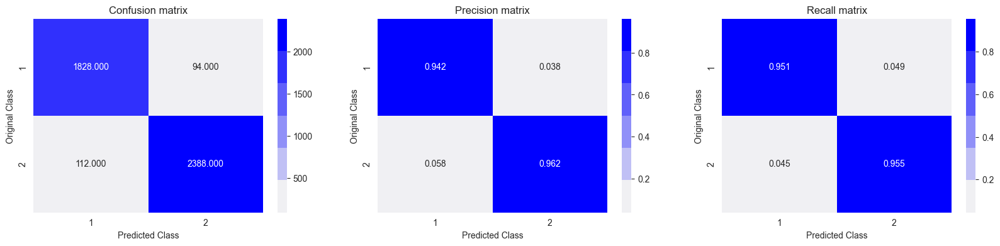

In [53]:
plot_confusion_matrix(test_Y, dtree_predict)

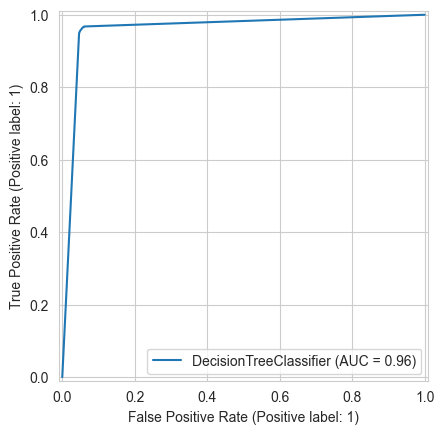

In [54]:
RocCurveDisplay.from_estimator(model_3,test_X, test_Y)

## Lets apply Random Forest Classifier and check its accuracy



The accuracy of Random Forest Classifier is: 55.201266395296244
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.00      0.00      0.00      1900
           1       0.98      0.97      0.97      2522

    accuracy                           0.55      4422
   macro avg       0.33      0.32      0.32      4422
weighted avg       0.56      0.55      0.55      4422

Model saved successfully!


c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control t

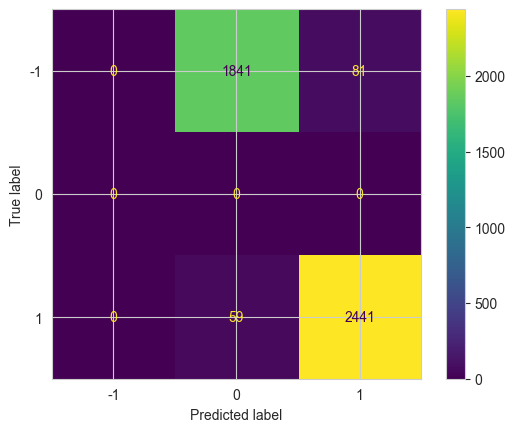

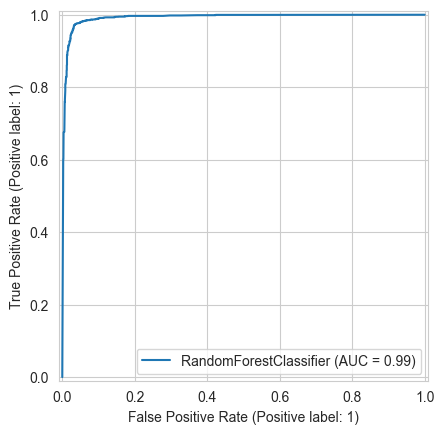

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay
import pickle

# Train Random Forest model
rfc = RandomForestClassifier()
model_4 = rfc.fit(train_X, train_Y)  # ✅ Train the model

# Make predictions
rfc_predict = model_4.predict(test_X)

# Evaluate the model
print('The accuracy of Random Forest Classifier is:', 100.0 * accuracy_score(rfc_predict, test_Y))
print(classification_report(rfc_predict, test_Y))

# Plot confusion matrix and ROC curve
ConfusionMatrixDisplay.from_predictions(test_Y, rfc_predict)
RocCurveDisplay.from_estimator(model_4, test_X, test_Y)

# ✅ Save the model (NOT the predictions)
with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(model_4, file)

print("Model saved successfully!")


C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2948309362.py:3: RuntimeWarning: invalid value encountered in divide
  A =(((C.T)/(C.sum(axis=1))).T)
C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2948309362.py:4: RuntimeWarning: invalid value encountered in divide
  B =(C/C.sum(axis=0))


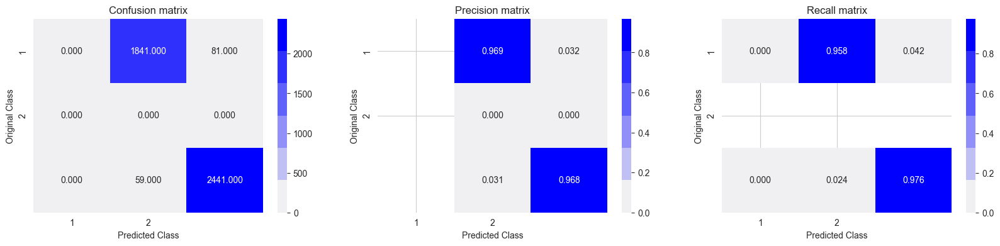

In [87]:
plot_confusion_matrix(test_Y, rfc_predict)


##Lets Apply SVM and check its accuracy



In [85]:
import pickle

# Save the model to a file
with open('random_forest_model.pkl', 'wb') as file:
    pickle.dump(rfc_predict, file)


In [62]:
from sklearn.svm import SVC


In [63]:
svc=SVC()
model_5=svc.fit(train_X,train_Y)

c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\utils\validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [64]:
svm_predict=model_5.predict(test_X)


In [65]:
print('The accuracy of SVM Classifier is: ', 100.0 * accuracy_score(svm_predict,test_Y))


The accuracy of SVM Classifier is:  94.4142921754862


In [66]:
print(classification_report(svm_predict,test_Y))


              precision    recall  f1-score   support

          -1       0.92      0.95      0.93      1855
           1       0.96      0.94      0.95      2567

    accuracy                           0.94      4422
   macro avg       0.94      0.95      0.94      4422
weighted avg       0.94      0.94      0.94      4422



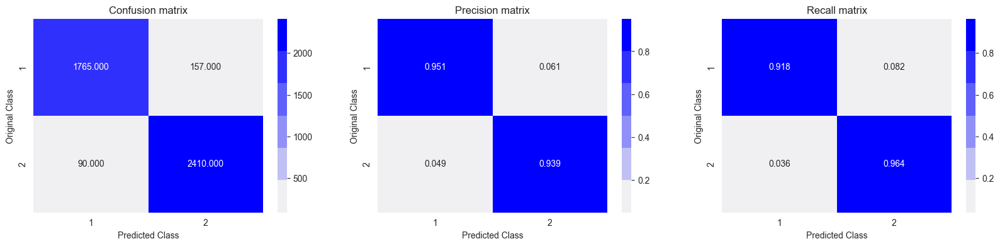

In [67]:
plot_confusion_matrix(test_Y, svm_predict)


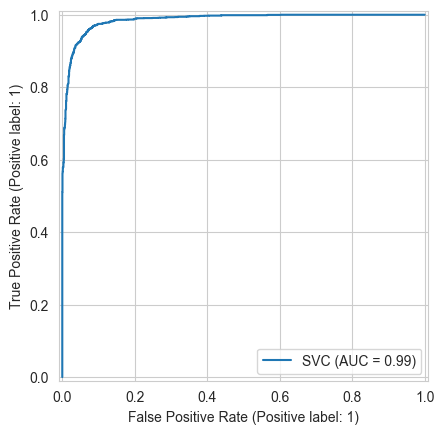

In [68]:
RocCurveDisplay.from_estimator(model_5,test_X, test_Y)

## Lets apply AdaBoost Classifier and check its accuracy



In [69]:
from sklearn.ensemble import AdaBoostClassifier


In [70]:
adc=AdaBoostClassifier(n_estimators=5,learning_rate=1)
model_6=adc.fit(train_X,train_Y)


c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\utils\validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [71]:
adc_predict=model_6.predict(test_X)


In [72]:
print('The accuracy of Ada Boost Classifier is: ', 100.0 * accuracy_score(adc_predict,test_Y))


The accuracy of Ada Boost Classifier is:  91.42921754862053


In [73]:
print(classification_report(adc_predict,test_Y))


              precision    recall  f1-score   support

          -1       0.90      0.90      0.90      1919
           1       0.92      0.92      0.92      2503

    accuracy                           0.91      4422
   macro avg       0.91      0.91      0.91      4422
weighted avg       0.91      0.91      0.91      4422



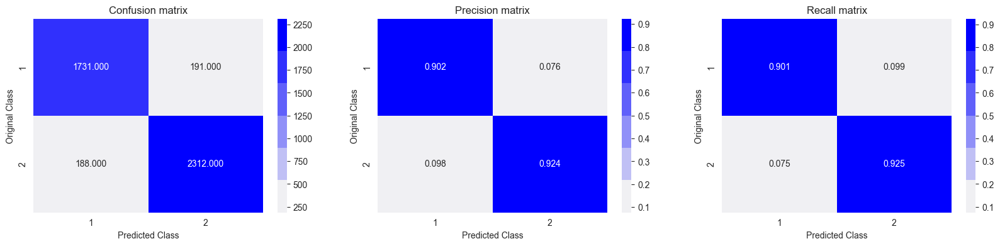

In [74]:
plot_confusion_matrix(test_Y, adc_predict)


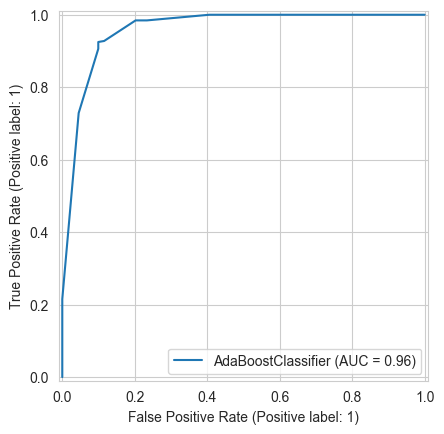

In [75]:
RocCurveDisplay.from_estimator(model_6,test_X, test_Y)

## Lets apply XGBoost Classifier and check its accuracy



In [77]:
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder

In [78]:
xgb=XGBClassifier()
le = LabelEncoder()
train_Y = le.fit_transform(train_Y)
model_7=xgb.fit(train_X,train_Y)

c:\Users\SPruthvi\Downloads\Phishing-websites-detection-using-ML\venv\Lib\site-packages\sklearn\preprocessing\_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [79]:
xgb_predict=model_7.predict(test_X)

In [80]:
print('The accuracy of XGBoost Classifier is: ' , 100.0 * accuracy_score(xgb_predict,test_Y))

The accuracy of XGBoost Classifier is:  55.06558118498417


C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2948309362.py:3: RuntimeWarning: invalid value encountered in divide
  A =(((C.T)/(C.sum(axis=1))).T)
C:\Users\SPruthvi\AppData\Local\Temp\ipykernel_12516\2948309362.py:4: RuntimeWarning: invalid value encountered in divide
  B =(C/C.sum(axis=0))


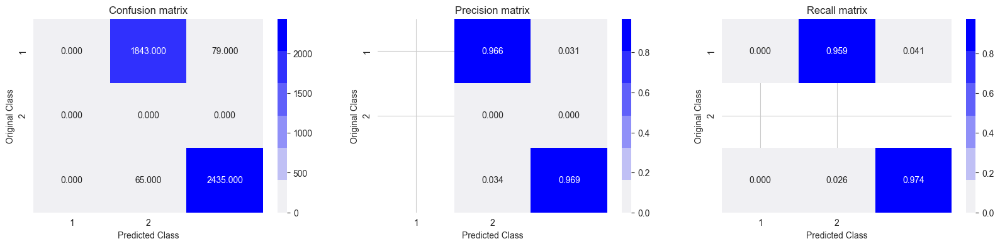

In [81]:
plot_confusion_matrix(test_Y, xgb_predict)

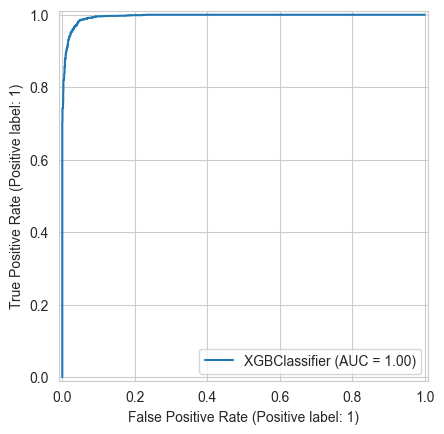

In [82]:
RocCurveDisplay.from_estimator(model_7,test_X, test_Y)

In [83]:
print('Logistic Regression Accuracy:',100 * accuracy_score(logreg_predict,test_Y))
print('K-Nearest Neighbour Accuracy:',100* accuracy_score(knn_predict,test_Y))
print('Decision Tree Classifier Accuracy:',100* accuracy_score(dtree_predict,test_Y))
print('Random Forest Classifier Accuracy:',100*accuracy_score(rfc_predict,test_Y))
print('support Vector Machine Accuracy:',100*accuracy_score(svm_predict,test_Y))
print('Adaboost Classifier Accuracy:',100*accuracy_score(adc_predict,test_Y))
print('XGBoost Accuracy:',100*accuracy_score(xgb_predict,test_Y))

Logistic Regression Accuracy: 92.71822704658526
K-Nearest Neighbour Accuracy: 93.62279511533242
Decision Tree Classifier Accuracy: 95.34147444595206
Random Forest Classifier Accuracy: 96.6078697421981
support Vector Machine Accuracy: 94.4142921754862
Adaboost Classifier Accuracy: 91.42921754862053
XGBoost Accuracy: 55.06558118498417


**From all the models we developed , Random Forest accuracy has highest accuracy and followed by Decision Tree and XGBoost. Lowest accuracy model is Adaboost.**

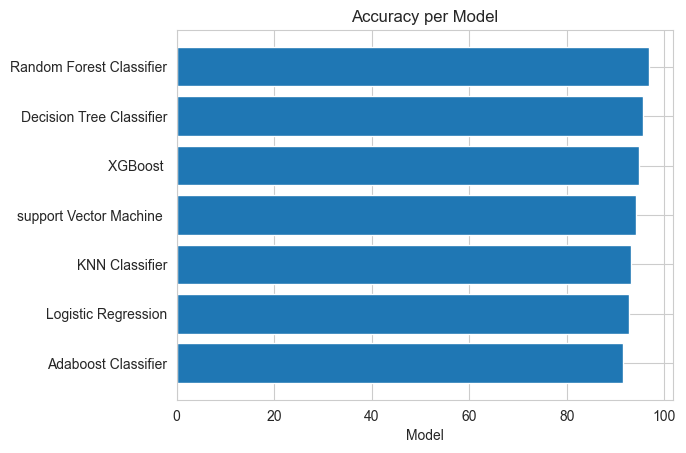

<Figure size 640x480 with 0 Axes>

In [84]:
objects = ('Adaboost Classifier', 'Logistic Regression', 'KNN Classifier', 'support Vector Machine ', 'XGBoost ', 'Decision Tree Classifier', 'Random Forest Classifier')
y_pos = np.arange(len(objects))
performance = [91.42921754862053, 92.7860696517413, 93.08005427408412, 94.25599276345545, 94.86657620985979, 95.52238805970149, 96.85662596110357]
plt.barh(y_pos, performance, align='center', alpha=1.0)
plt.yticks(y_pos, objects)
plt.xlabel('Accuracy')
plt.xlabel('Model')
plt.title('Accuracy per Model')

plt.show()
plt.savefig('accuracy_per_model.png')